In [49]:
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.cm as cm
import matplotlib.tri as tri
from matplotlib import cm, colors
from matplotlib.tri import Triangulation, TriAnalyzer, UniformTriRefiner
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.dates import DateFormatter
#from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import cbook
from matplotlib.colors import LightSource
from matplotlib.markers import MarkerStyle
import matplotlib.patches as patches

from scipy import stats
from scipy import interpolate
from scipy.interpolate import griddata, interp1d
from scipy.interpolate import make_interp_spline, BSpline
from scipy.interpolate import interp1d
from scipy.interpolate import LinearNDInterpolator

import shapely
from shapely.geometry import Point, LineString
#from shapely.ops import nearest_points

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.offline
import plotly.express as px

import rasterio
from rasterio.transform import rowcol

import pyproj
from pyproj import Transformer
from pyproj import Geod

import metpy
from metpy import calc
from metpy.units import units

import geopandas as gpd
import os
import glob
import time
import requests
import ast
from datetime import datetime, timedelta
#import datetime
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D
from windrose import WindroseAxes
import seaborn as sns
from pathlib import Path
from PIL import Image
#import cufflinks as cf
import cartopy.crs as ccrs
#import cartopy.io.img_tiles as cimgt
#import pygmt
import dask

In [50]:
%run 'loadData.py'

/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadData.py:88: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadData.py:115: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single s

correcting wind direction


/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadData.py:229: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadDa

/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadData.py:258: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/home/kfha/OneDrive/ALT/JOSTICE/Jostedalen2023/github_code/nigardsbreen_data-campaign/loadDa

data/UAV/iMet/20230912-213501-00061143_inlet.csv
data/UAV/iMet/20230913-203721-00061143_inlet.csv
data/UAV/iMet/20230912-211512-00061169_glacier.csv
data/UAV/iMet/20230914-181348-00065805_glacier.csv
data/UAV/iMet/LATER_20231018-092721-00065717_glacier.csv
data/UAV/iMet/20230913-141957-00065717_paraglider.csv
data/UAV/iMet/20230912-141957-00065717_front.csv
data/UAV/iMet/20230912-212134-00065805_outlet.csv
data/UAV/iMet/20230913-202034-00065805_glacier.csv
data/UAV/iMet/20230914-193303-00061169_inlet.csv
data/UAV/iMet/20230913-211517-00065808_outlet.csv
data/UAV/iMet/20230914-183917-00061143_front.csv
data/UAV/iMet/20230913-202940-00061169_front.csv
FF1
FF2
FF3
FF4
FF5
FF6
FF7
FF8
FF9


In [56]:
with open('plotData.py') as f:
    exec(f.read())

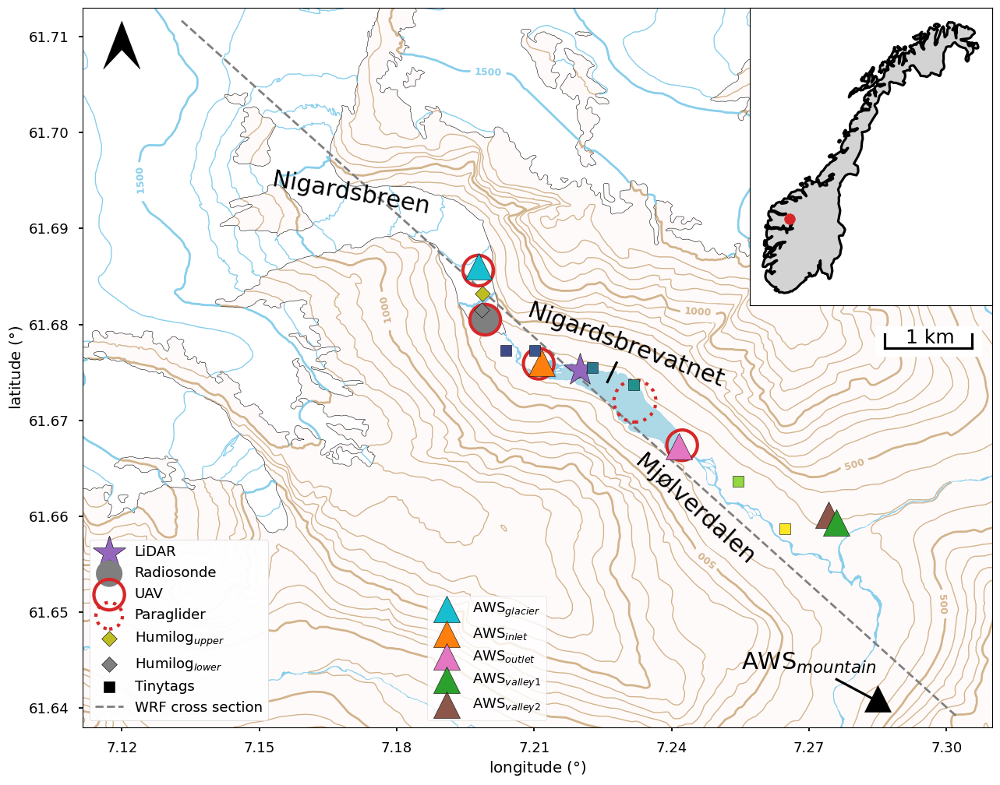

In [57]:
plotMap()

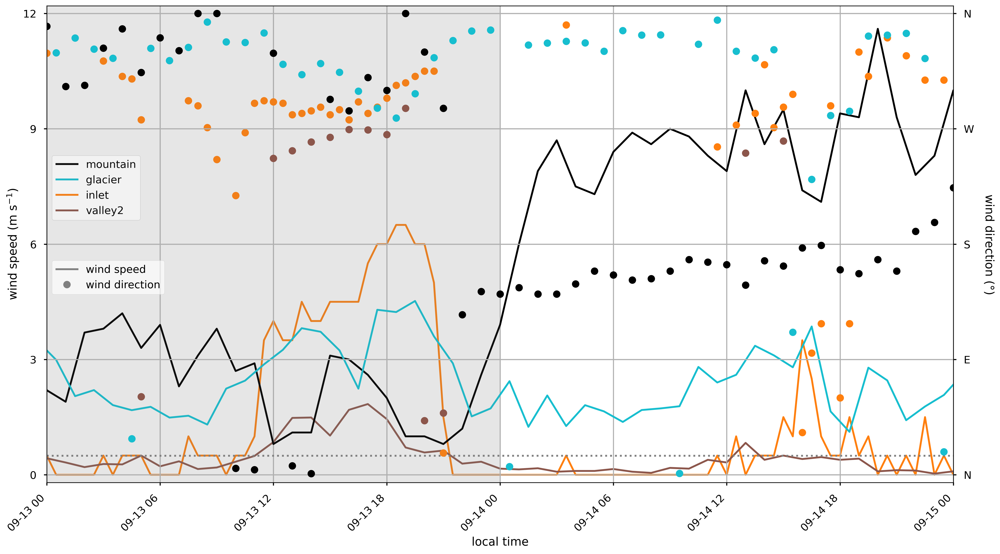

In [58]:
plotWindEvolution()

<string>:586: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



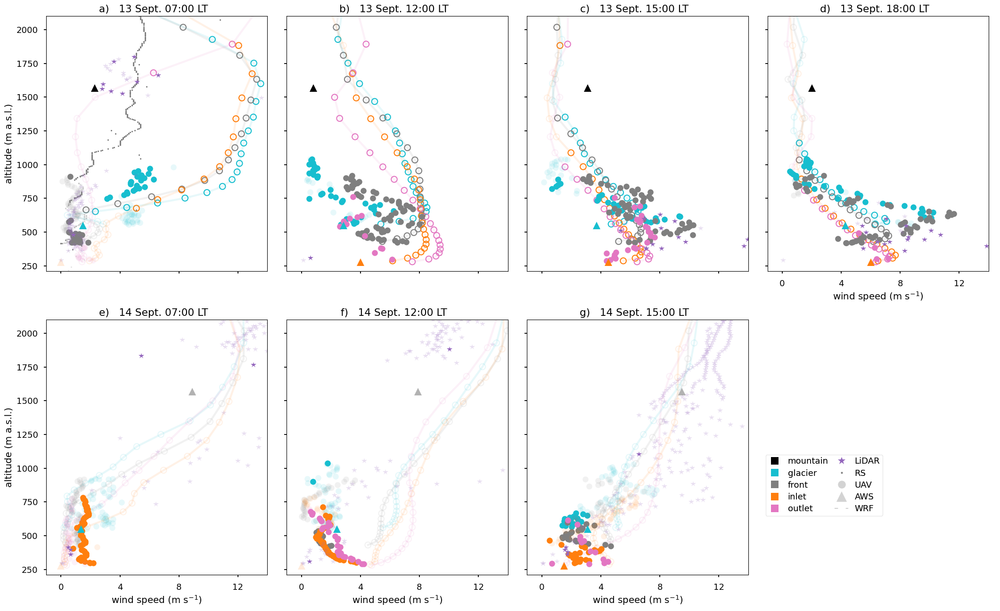

In [54]:
plotVerticalWindProfiles()

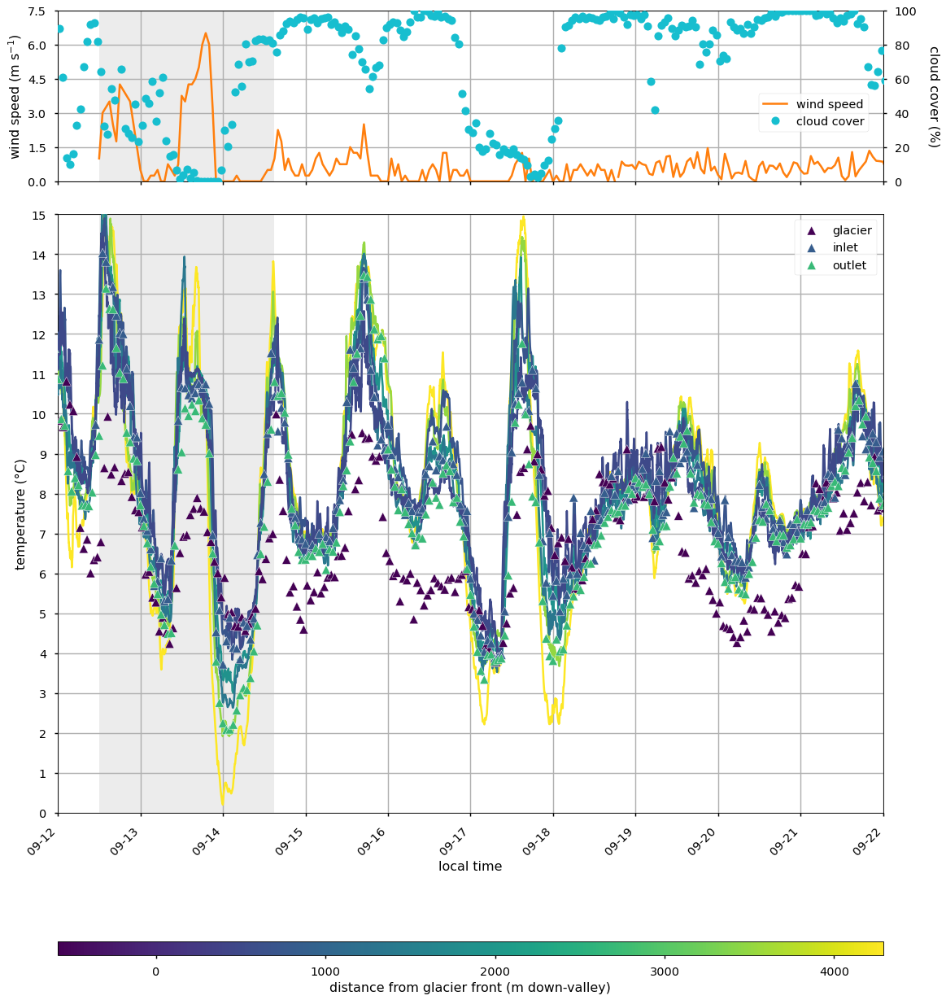

In [55]:
plotColdAirPools()

using paraglider data
13-13-US-inlet.csv
13-13-US-paraglider
13-13-US-glacier.cs
13-13-US-outlet.csv
13-13-US-front.csv
adding paraglider
using already stored intalts
using already stored intalts_extended


<string>:1434: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<string>:1434: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

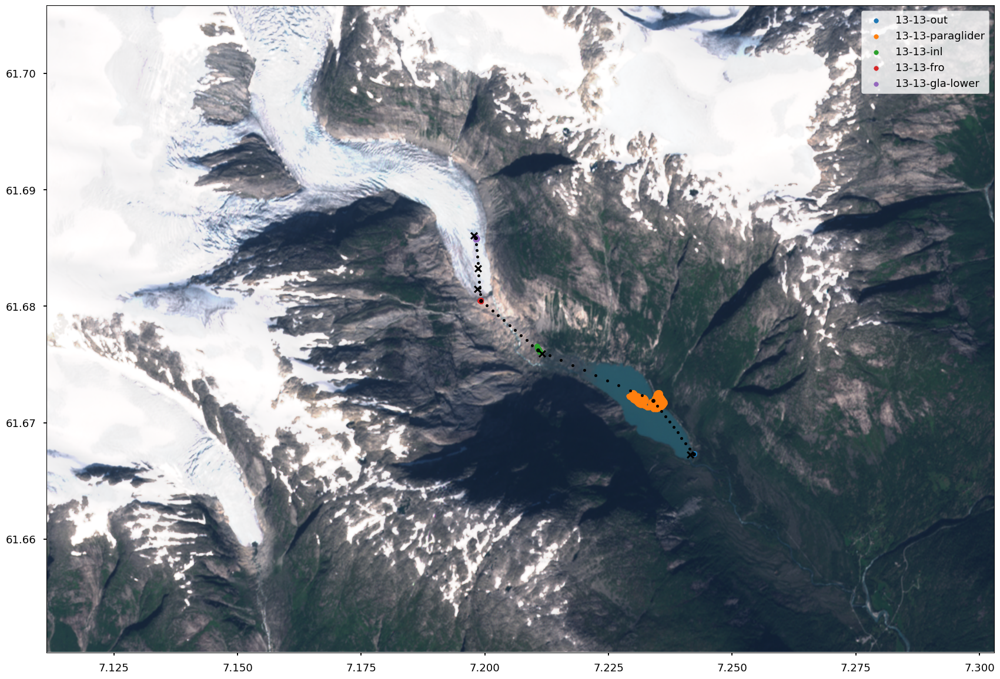

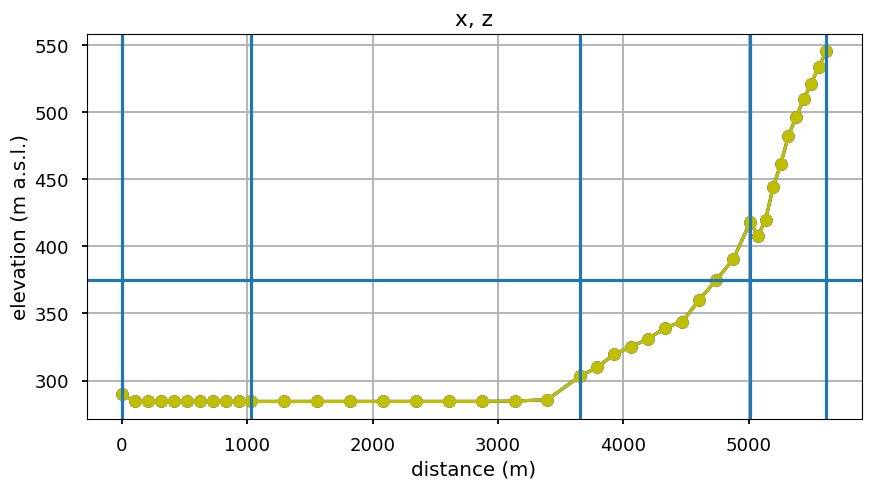

pt
           z          pt
0    898.854  286.946579
1    896.920  286.947455
2    895.322  286.970267
3    893.200  286.968020
4    890.107  286.942500
..       ...         ...
294  408.726  286.628622
295  406.197  286.627777
296  404.070  286.618508
297  401.363  286.596604
298  401.363  286.561231

[299 rows x 2 columns]
shifting profile nr 3 up 8.076159999999959 meters
72 477
117 614
30 478
0 487
4 496
3657.523379559949


<string>:1574: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<string>:1575: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<string>:1574: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<string>:1575: SettingWithCopyWarning:


A value is trying to be set on a copy of a s

pt
plotting lake line
plotting glacier line
t
           z      t
0    898.854   5.66
1    896.920   5.68
2    895.322   5.71
3    893.200   5.72
4    890.107   5.73
..       ...    ...
294  408.726  10.11
295  406.197  10.13
296  404.070  10.15
297  401.363  10.16
298  401.363  10.16

[299 rows x 2 columns]
shifting profile nr 3 up 8.076159999999959 meters


<string>:1574: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<string>:1575: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<string>:1574: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<string>:1575: SettingWithCopyWarning:


A value is trying to be set on a copy of a s

72 477
117 614
30 478
0 487
4 496
3657.523379559949
adding glacier near-surface observation and interpolating linearly up to start of vertical profile
adding outlet near-surface observation and interpolating linearly up to start of vertical profile
adding inlet near-surface observation and interpolating linearly up to start of vertical profile
t
418.17566 418.17566 127.31659000000002
plotting lake line
plotting glacier line


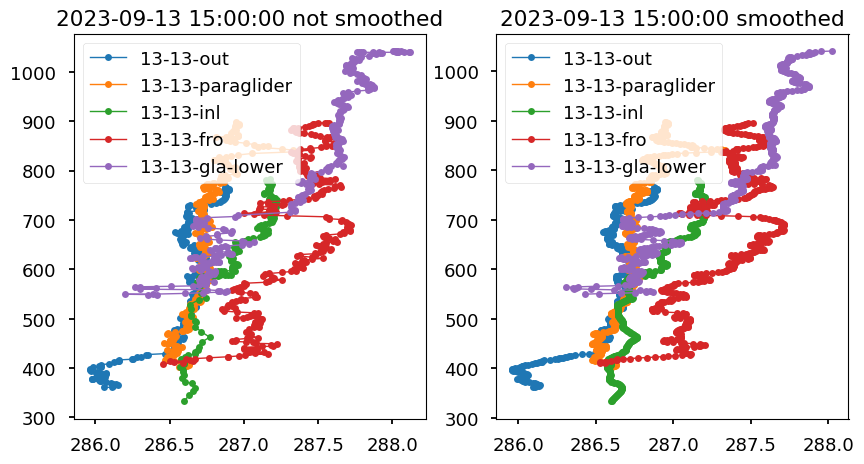

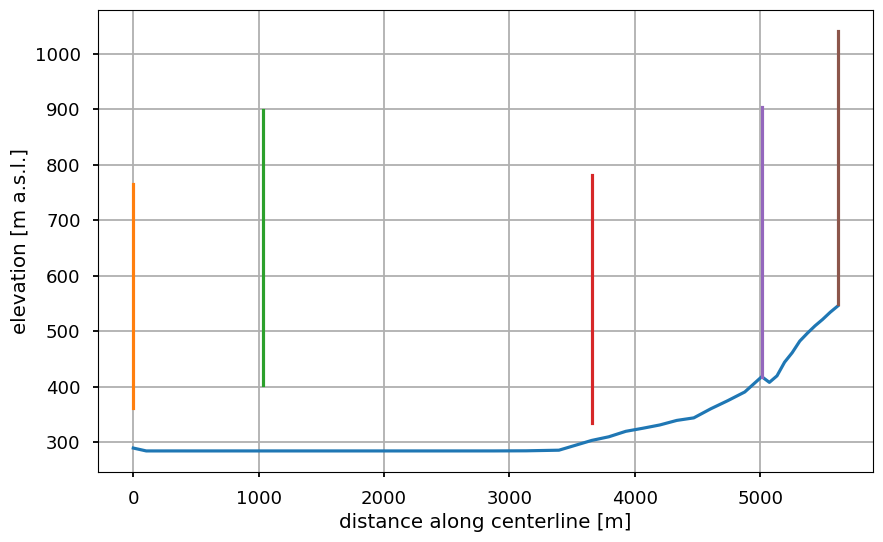

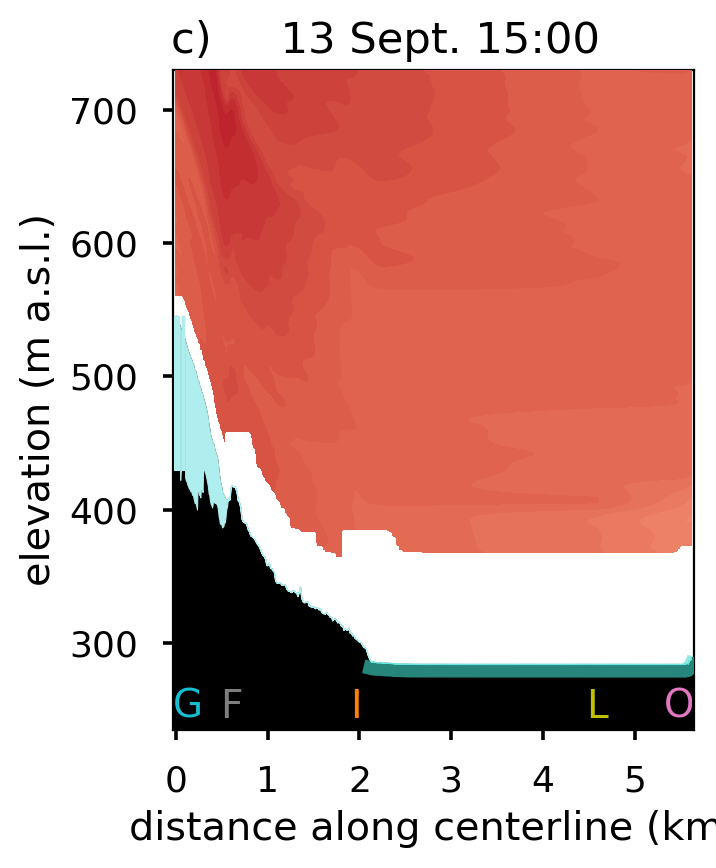

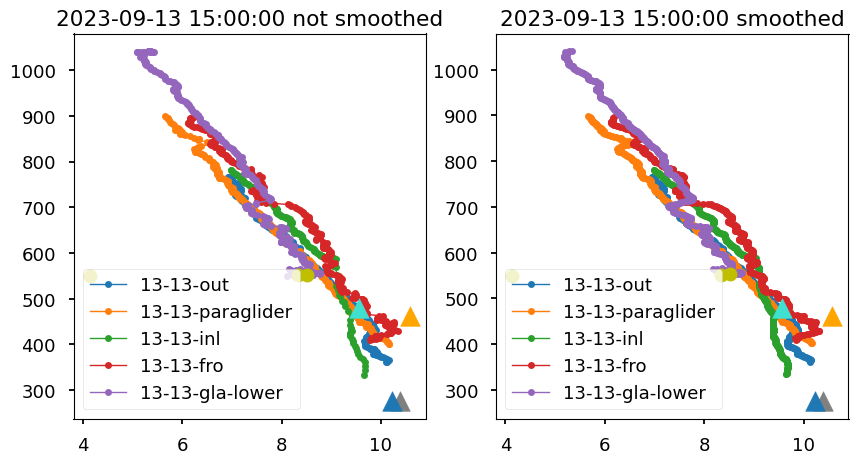

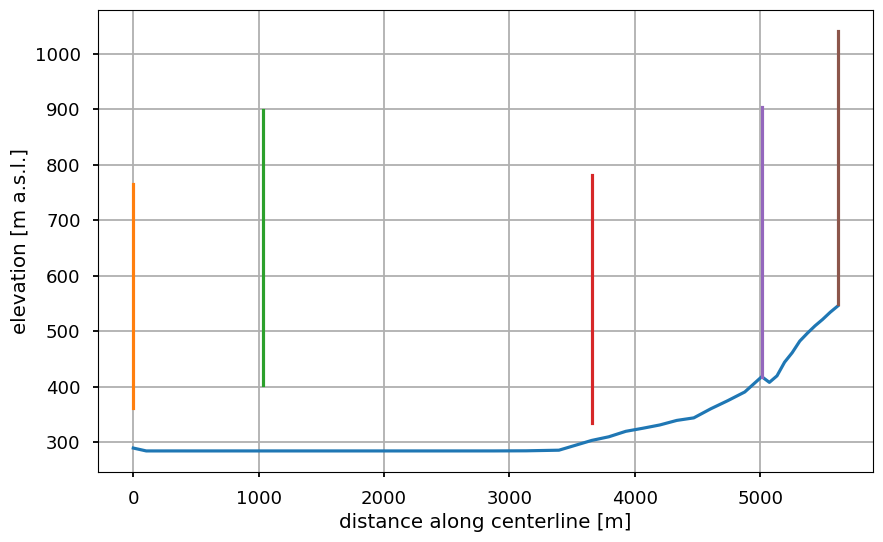

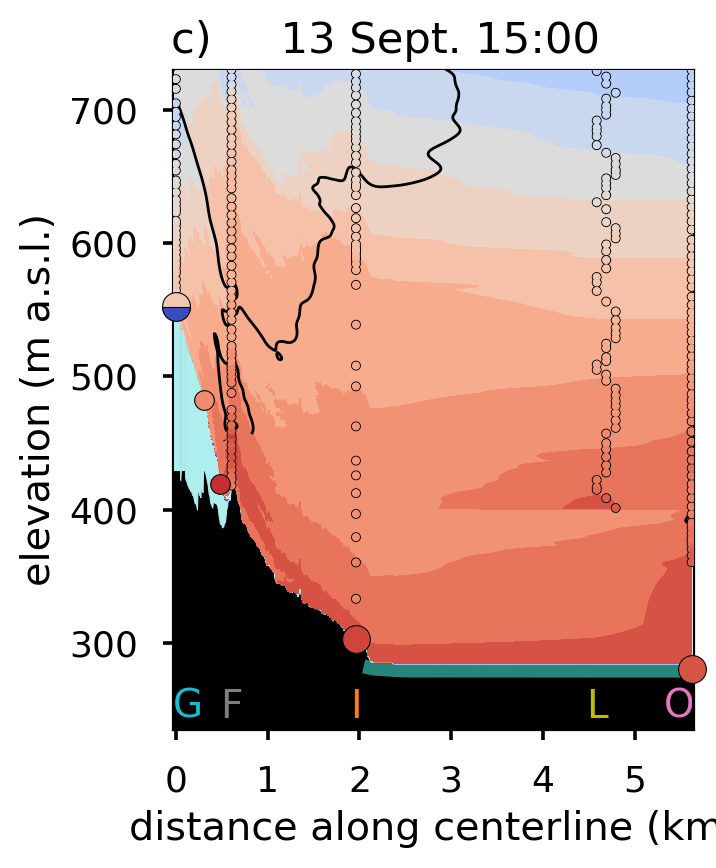

In [59]:
t, imets, intdist, intpts, intalts, intalts_extended, date = interpolateUAV_p1(ind1=6, ind2=8, day='13')
pt_contours = interpolateUAV_p2(var='pt', date=date)
interpolateUAV_p2(var='t', date=date, pt_contours=pt_contours)

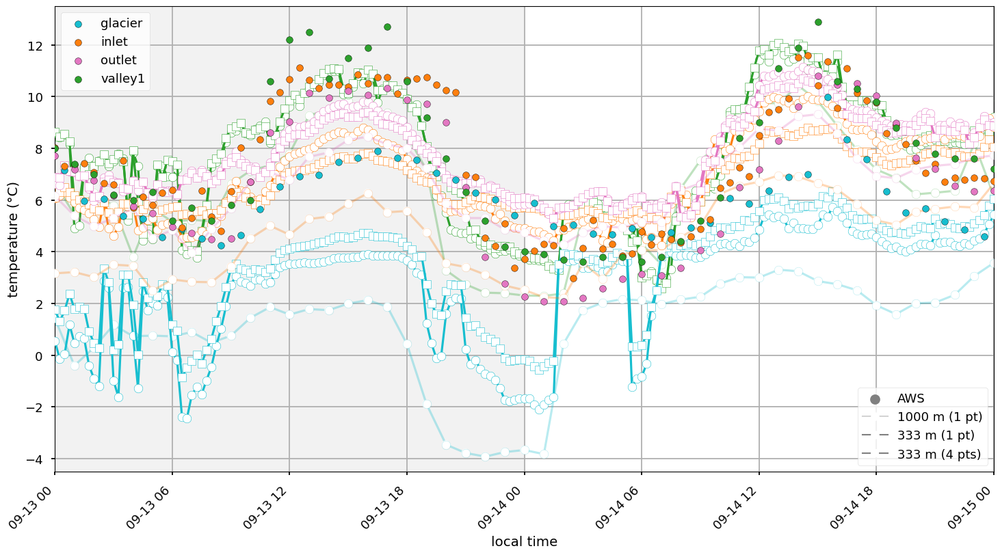

In [60]:
plotTemperatureEvolution()

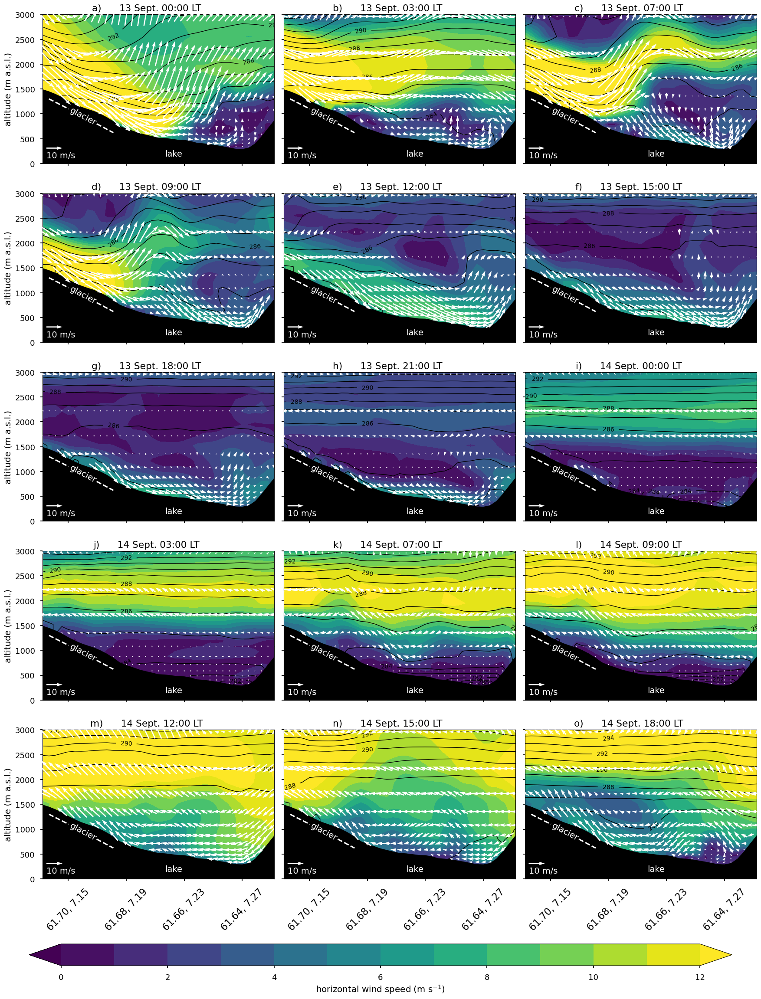

In [61]:
plotWindCrossSection(var='ws')

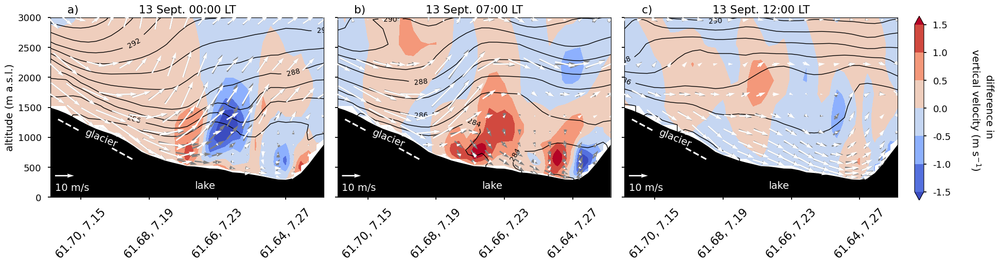

In [62]:
plotLakeTempSensitivity(var='w')

<string>:2819: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



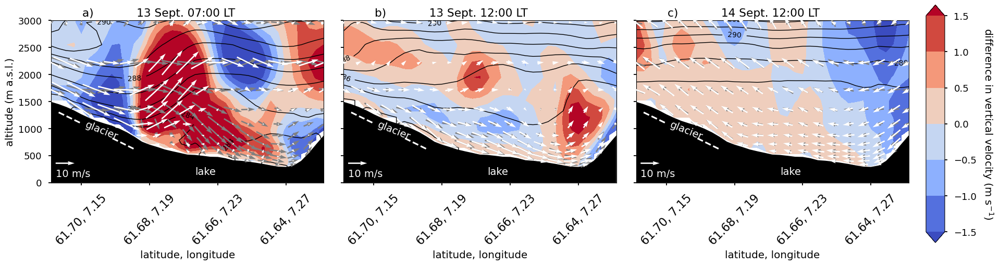

In [63]:
plotGlacierSensitivity(var='w')

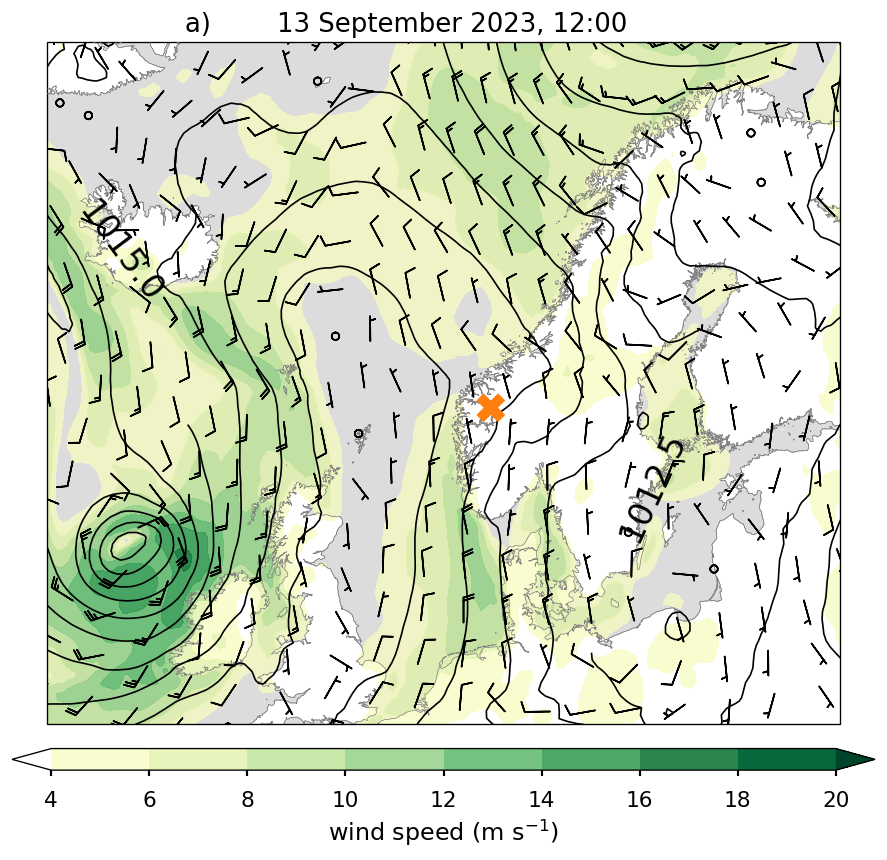

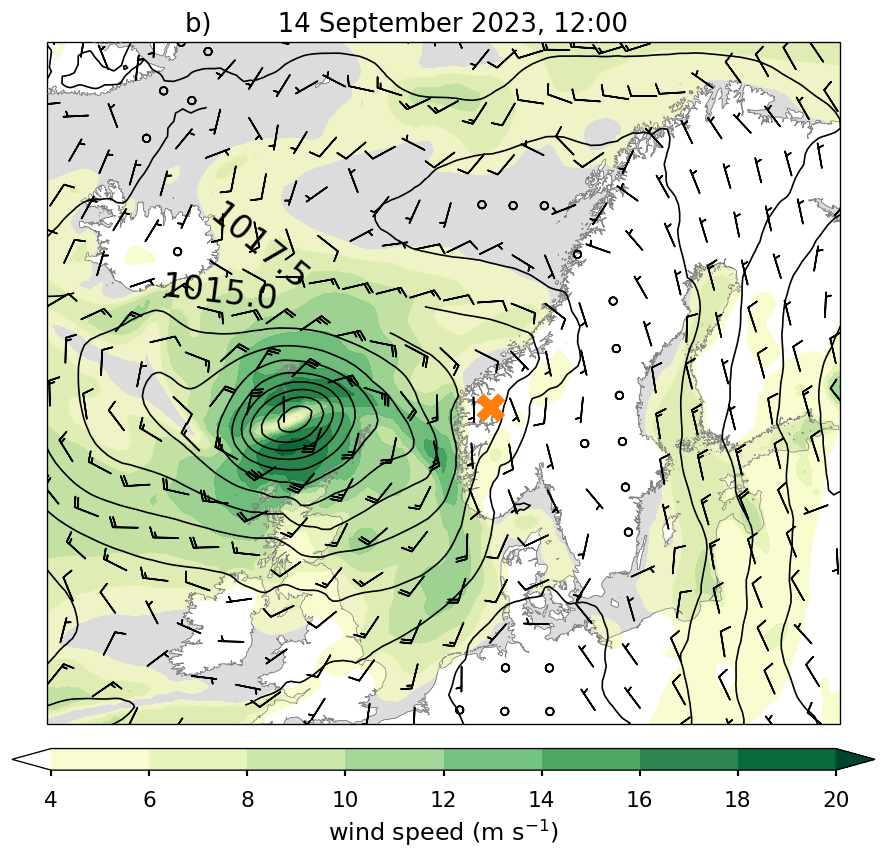

In [64]:
plotERA5()